## BertTopic synthetic data

Create Topics on the generated dataset. 

In [2]:
import sqlite3
import pandas as pd
import random

from gensim.models.coherencemodel import CoherenceModel
import gensim.corpora as corpora

from hdbscan import HDBSCAN
from umap import UMAP

from sentence_transformers import SentenceTransformer
from sklearn.feature_extraction.text import CountVectorizer

from bertopic.representation import KeyBERTInspired
from bertopic import BERTopic
from bertopic.representation import PartOfSpeech
from bertopic.representation import OpenAI 
from bertopic.representation import ZeroShotClassification

import openai
import pickle
import re
import os 

import warnings
warnings.filterwarnings("ignore")

os.environ["TOKENIZERS_PARALLELISM"]="false"
pd.set_option('display.max_colwidth', 400)

# Read generated data


In [3]:
conn = sqlite3.connect('data/synthetic_data.db')
df = pd.read_sql_query("SELECT * FROM generated_texts", conn)
conn.close()
df.shape

(4790, 3)

In [4]:
df.sample(2)

,id,text,generated_text
2608,2609,"product_name:risotto ai porcini, labels:Senza glutine, Senza conservanti","Risotto ai porcini is a delicious Italian dish that features the earthy and aromatic flavors of porcini mushrooms. This particular version of risotto is gluten-free, making it a great option for individuals with dietary restrictions. It is also free from any artificial preservatives, ensuring a wholesome and natural dining experience. The combination of creamy Arborio rice, flavorful porcini m..."
4498,4499,"product_name:Arachidi Tostate in guscio, _keywords:arachidi,guscio,in,tostate","Arachidi Tostate in guscio, also known as toasted peanuts in their shell, are a delicious and crunchy snack that is enjoyed by many. These peanuts are carefully roasted to perfection, resulting in a rich and nutty flavor that is hard to resist. The shells add an extra layer of texture and make for a fun and interactive eating experience. Arachidi Tostate in guscio can be enjoyed on their own a..."


In [5]:
# Show how many the LLM could not generate information for
df.query("generated_text=='NO INFORMATION FOUND.'").shape

(49, 3)

In [6]:
df_information_found = df.query("generated_text!='NO INFORMATION FOUND.'").copy()
df_information_found.shape

(4741, 3)

In [7]:
# Use only documents with LLM generated content
docs = df_information_found['generated_text'].to_list()
len(docs)

4741

In [9]:
# Sample 3 records
begin = random.randint(0,len(docs))
end = begin + 3
docs[begin:end]

["Soft butter is a delicious and versatile spread that is perfect for adding a rich and creamy touch to your favorite dishes. One popular brand of soft butter is Devondale, known for its high-quality dairy products. Made from milkfat sourced from animals, this soft butter is a must-have in any kitchen.\n\nWith its smooth and spreadable texture, Devondale soft butter is incredibly easy to use. Whether you're spreading it on toast, melting it over pancakes, or incorporating it into your baking recipes, this butter adds a delightful richness and flavor. Its soft consistency makes it effortless to spread, even straight from the fridge.\n\nDevondale soft butter falls under the categories of Dairies, Fats, Spreads, Spreadable fats, Animal fats, Milkfat, Dairy spread, and Butters. It is a versatile ingredient that can be used in a wide range of recipes, from savory to sweet. Whether you're making a classic buttercream frosting or simply enjoying a slice of warm bread with butter, Devondale so

## Build BERTopic model 

In [8]:
# UMAP model for dimensionality reduction
umap_model = UMAP(n_neighbors=5, n_components=5, metric='cosine', low_memory=False)
# HDBSCAN model
hdbscan_model = HDBSCAN(min_cluster_size=10, metric='euclidean', prediction_data=True)
# Embedder
embedding_model = SentenceTransformer("distiluse-base-multilingual-cased-v1")
# Vectorizer
vectorizer_model = CountVectorizer(stop_words="english")

In [9]:
# Pre calculate embeddings
embeddings = embedding_model.encode(docs, show_progress_bar=True)

Batches:   0%|          | 0/149 [00:00<?, ?it/s]

### Out of the box BERTopic

In [10]:
%%time
# Run bertopic
topic_model = BERTopic(embedding_model=embedding_model, umap_model=umap_model, 
                       hdbscan_model=hdbscan_model, language="multilingual")
topics, probs = topic_model.fit_transform(docs)

CPU times: user 1min 10s, sys: 7.99 s, total: 1min 18s
Wall time: 31.9 s


In [11]:
# Show first topics
df_tp = topic_model.get_topic_info()
print(f"Number of topics:{len(df_tp)}")
df_tp.head(5)

Number of topics:106


,Topic,Count,Name,Representation,Representative_Docs
0,-1,1150,-1_the_of_and_to,"[the, of, and, to, is, with, in, that, for, or]","[Chocolate sin azúcar con Almendra is a delicious treat that combines the rich and indulgent flavor of chocolate with the nutty crunch of almonds. This delectable treat is perfect for those who are looking to satisfy their sweet tooth without the guilt of consuming sugar. Made with high-quality cocoa and sweetened with alternative sweeteners, this chocolate is a healthier option for those who ..."
1,0,138,0_cheese_cheddar_queso_dairy,"[cheese, cheddar, queso, dairy, its, creamy, fermented, milk, cow, it]","[Sliced natural white cheddar cheese is a delicious and versatile food product made from fermented milk. This particular cheese is known for its smooth texture and rich flavor. It is made using traditional cheddar cheese-making techniques, resulting in a high-quality product that is loved by cheese enthusiasts.\n\nThe cheese is made from natural ingredients, with no artificial additives or pre..."
2,1,123,1_rillettes_cabillaud_cod_de,"[rillettes, cabillaud, cod, de, fish, spread, seafood, food, products, crackers]","[Rillettes de cabillaud, also known as cod rillettes, is a delicious seafood spread that can be enjoyed on bread or crackers. Made from salted and seasoned cod, this product falls under the categories of ""Produits de la mer"" (Seafood Products), ""Poissons et dérivés"" (Fish and Derivatives), ""Produits à tartiner"" (Spreadable Products), ""Produits à tartiner salés"" (Savory Spreads), ""Rillettes"" (P..."
3,2,118,2_chicken_poulet_pollo_tender,"[chicken, poulet, pollo, tender, breast, de, meal, meat, option, and]","[Roast chicken breast fillets are a delicious and versatile meat option that can be enjoyed in a variety of dishes. These fillets are made from tender chicken breasts that have been expertly roasted to perfection, resulting in a juicy and flavorful product.\n\nAs part of the meats, poultries, chickens, and chicken breasts categories, these roast chicken breast fillets are a popular choice for ..."
4,3,100,3_oil_olives_olive_oliva,"[oil, olives, olive, oliva, extra, aceite, huile, de, olio, virgen]","[Olio extra vergine di oliva, also known as extra virgin olive oil, is a high-quality oil derived from olives. It is made by pressing olives to extract their natural oils, without the use of any chemicals or heat. This ensures that the oil retains its natural flavors and nutritional benefits.\n\nExtra virgin olive oil is widely used in cooking and is known for its distinct taste and aroma. It ..."


In [12]:
# Calculate percentage of items per cluster
df_tp = topic_model.get_document_info(docs)
df_tp['Topic'].value_counts(normalize=True)[0:10]

Topic
-1    0.242565
 0    0.029108
 1    0.025944
 2    0.024889
 3    0.021093
 4    0.020038
 5    0.020038
 6    0.018772
 7    0.016030
 8    0.015609
Name: proportion, dtype: float64

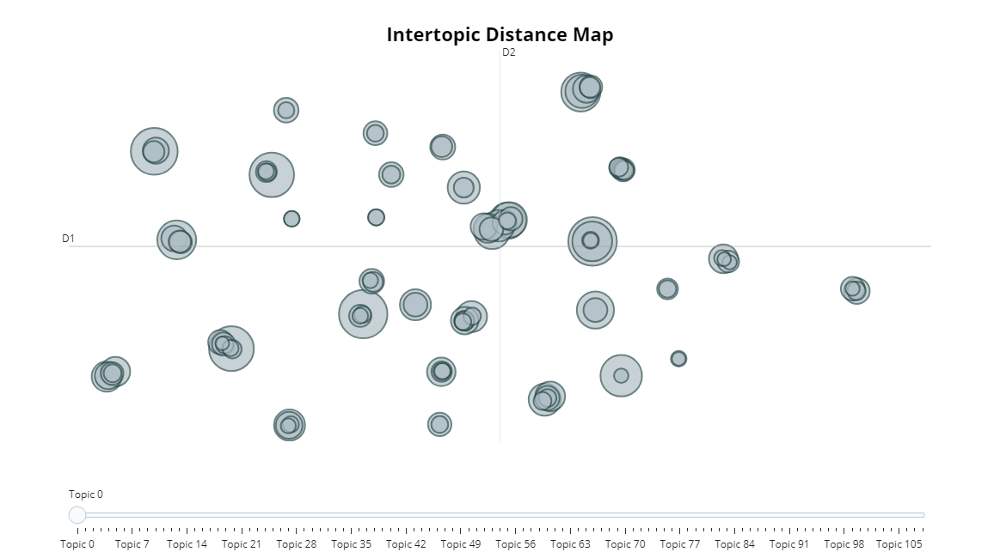

In [16]:
topic_model.visualize_topics()

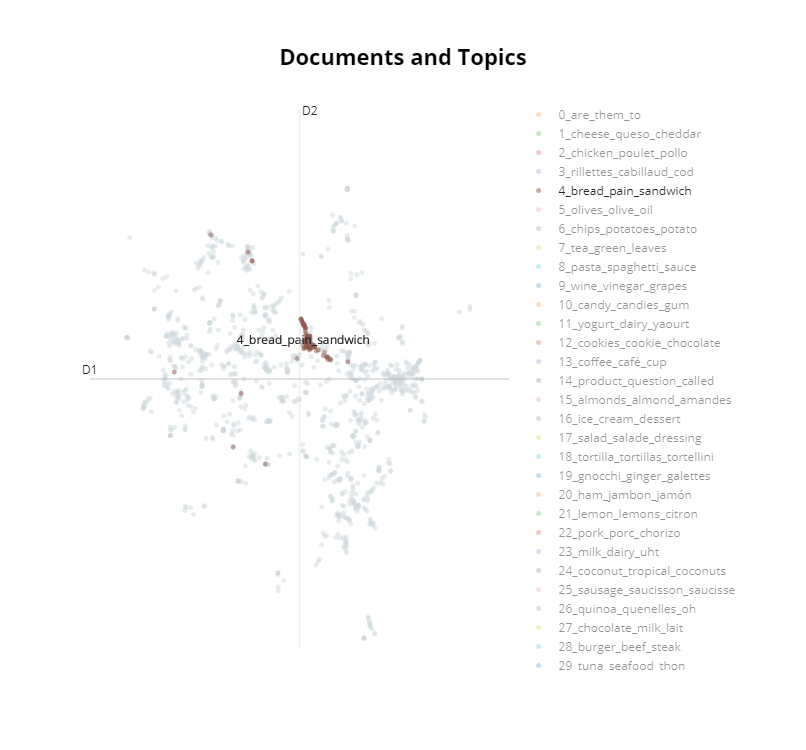

In [17]:
# Run the visualization with the original embeddings
# Reduce dimensionality of embeddings, this step is optional but much faster to perform iteratively:
reduced_embeddings = UMAP(n_neighbors=10, n_components=2, min_dist=0.0, metric='cosine').fit_transform(embeddings)
topic_model.visualize_documents(docs, reduced_embeddings=reduced_embeddings)


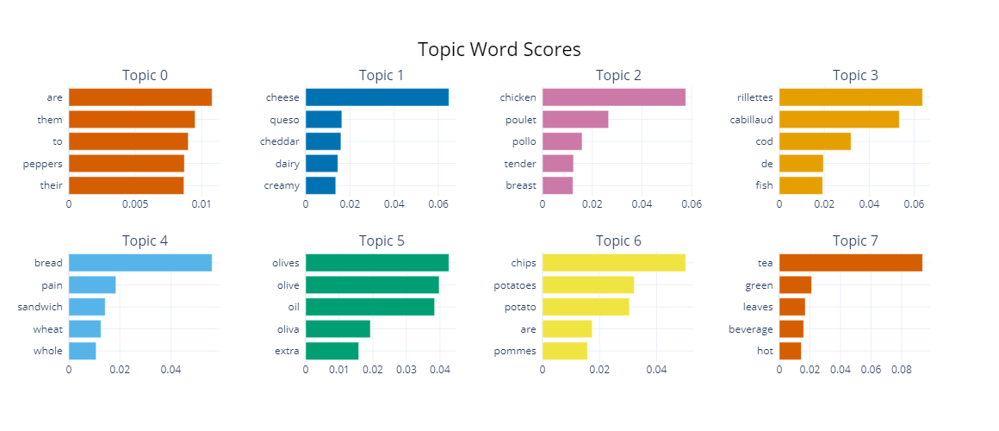

In [18]:
topic_model.visualize_barchart()

## Evaluate with Coherence

It calculates how interpretable topics are to humans.

In [14]:
def evaluate_topics(docs, topics, topic_model, vectorizer):
    """Given a set of docs, topics, the topic_model, vectorizer, and return coherence"""
    documents = pd.DataFrame({"Document": docs,
                              "ID": range(len(docs)),
                              "Topic": topics})
    documents_per_topic = documents.groupby(['Topic'], as_index=False).agg({'Document': ' '.join})
    cleaned_docs = topic_model._preprocess_text(documents_per_topic.Document.values)
    
    # Extract vectorizer and analyzer from BERTopic
    vectorizer = topic_model.vectorizer_model
    analyzer = vectorizer.build_analyzer()
    
    # Extract features for Topic Coherence evaluation
    words = vectorizer.get_feature_names_out()
    tokens = [analyzer(doc) for doc in cleaned_docs]
    dictionary = corpora.Dictionary(tokens)
    corpus = [dictionary.doc2bow(token) for token in tokens]

    topic_words = []
    topic_words = [[words for words, _ in topic_model.get_topic(topic)] 
                   for topic in range(len(set(topics))-1)]
                

    # Evaluate - how interpretable topics are to humans
    coherence_model = CoherenceModel(topics=topic_words, 
                                     texts=tokens, 
                                     corpus=corpus,
                                     dictionary=dictionary, 
                                     coherence='c_v')
    # Higher is better
    return coherence_model.get_coherence()

In [15]:
%%time
# Out of the box coherence
coherence = evaluate_topics(docs, topics, topic_model, vectorizer_model)
coherence

CPU times: user 3.17 s, sys: 3.53 s, total: 6.71 s
Wall time: 42.8 s


0.5433422714768301

## Use a Vectorizer

In [22]:
%%time
# Fine-tune topic representations by limiting with min_df (document frequency) and ngrams of between 1 and 3 words
vectorizer_model = CountVectorizer(stop_words="english", ngram_range=(1, 3), min_df=15)

# Use a vectorizer
topic_model = BERTopic(embedding_model=embedding_model, umap_model=umap_model, hdbscan_model=hdbscan_model, 
                       vectorizer_model=vectorizer_model, language="multilingual")
topics, probs = topic_model.fit_transform(docs)

CPU times: user 1min 4s, sys: 26.7 s, total: 1min 31s
Wall time: 18.3 s


In [23]:
df_tp = topic_model.get_document_info(docs)
df_tp['Topic'].value_counts(normalize=True)[0:10]

Topic
-1    0.258595
 0    0.043240
 1    0.023624
 2    0.020460
 3    0.018772
 4    0.018561
 5    0.018351
 6    0.018140
 7    0.016874
 8    0.016663
Name: proportion, dtype: float64

In [24]:
%%time
# coherence with CountVectorizer  
coherence = evaluate_topics(docs, topics, topic_model, vectorizer_model)
coherence

CPU times: user 16.1 s, sys: 4.25 s, total: 20.4 s
Wall time: 1min 1s


0.6601961425819494

## Try different Representation Models

### KeyBertInspired

In [25]:
%%time
# Create your representation model
representation_model = KeyBERTInspired()

# Use the representation model in BERTopic on top of the default pipeline
topic_model = BERTopic(embedding_model=embedding_model, umap_model=umap_model, hdbscan_model=hdbscan_model, 
                       vectorizer_model=vectorizer_model, language="multilingual",
                       representation_model=representation_model)
topics, probs = topic_model.fit_transform(docs, embeddings)
coherence = evaluate_topics(docs, topics, topic_model, vectorizer_model)
coherence

CPU times: user 1min 50s, sys: 31.5 s, total: 2min 21s
Wall time: 56.3 s


0.3797502536005433

### PartOfSpeech

In [26]:
%%time

# Create your representation model
representation_model = PartOfSpeech("en_core_web_sm")

topic_model = BERTopic(embedding_model=embedding_model, umap_model=umap_model, hdbscan_model=hdbscan_model, 
                       vectorizer_model=vectorizer_model, language="multilingual",
                       representation_model=representation_model)
topics, probs = topic_model.fit_transform(docs, embeddings)
coherence = evaluate_topics(docs, topics, topic_model, vectorizer_model)
coherence

CPU times: user 1min 37s, sys: 10.3 s, total: 1min 47s
Wall time: 1min 37s


0.7639848863561833

In [27]:
no_topics = len(topic_model.get_topic_info())-1
no_topics

103

In [28]:
# Store into variable for future processing
df_document_info_pos = topic_model.get_document_info(docs)

In [29]:
df_document_info_pos.to_pickle("data/df_document_info_pos.pickle")

### MaximalMarginalRelevance

In [30]:
%%time
from bertopic.representation import MaximalMarginalRelevance
# Create your representation model
representation_model = MaximalMarginalRelevance(diversity=0.7)
# Use the representation model in BERTopic on top of the default pipeline
topic_model = BERTopic(embedding_model=embedding_model, umap_model=umap_model, hdbscan_model=hdbscan_model, 
                       vectorizer_model=vectorizer_model, language="multilingual",
                       representation_model=representation_model)
topics, probs = topic_model.fit_transform(docs, embeddings)
coherence = evaluate_topics(docs, topics, topic_model, vectorizer_model)
coherence

CPU times: user 1min 20s, sys: 50.1 s, total: 2min 10s
Wall time: 1min 19s


0.4558907342818084

### OpenAI

In [87]:
# GPT-3.5
prompt = """
I have a topic that contains the following documents: 
[DOCUMENTS]
The topic is described by the following keywords: [KEYWORDS]

Based on the information above, extract a short but highly descriptive topic labels of at most 5 words each.
Extract at least 2 topic labels separated by a comma.
Make sure it is in the following format:
topic: <topic label 1>, <topic label 2>
"""

client = openai.OpenAI(api_key= "sk-")
representation_model = OpenAI(client, model="gpt-3.5-turbo", exponential_backoff=True, chat=True, prompt=prompt)

# Use the representation model in BERTopic on top of the default pipeline
topic_model = BERTopic(embedding_model=embedding_model, umap_model=umap_model, hdbscan_model=hdbscan_model, 
                       vectorizer_model=vectorizer_model, language="multilingual",
                       representation_model=representation_model)

topics, probs = topic_model.fit_transform(docs, embeddings)

In [96]:
df_document_info_openai = topic_model.get_document_info(docs)
df_document_info_openai.to_pickle("data/df_document_info_openai.pickle")

In [31]:
# Read precomputed earlier
df_document_info_openai = pd.read_pickle("data/df_document_info_openai.pickle")
df_document_info_openai.shape

(4741, 8)

In [95]:
# Save for further procesing
# with open("data/topics_openai.pickle", "wb") as f:
#     pickle.dump(topics, f)
# with open("data/probs_openai.pickle", "wb") as f:
#     pickle.dump(probs, f)

In [98]:
topic_model.get_topic_info()[0:5]

,Topic,Count,Name,Representation,Representative_Docs
0,-1,1159,"-1_no sugar added fruit cocktail, Tropicana Orange et Mangue","[no sugar added fruit cocktail, Tropicana Orange et Mangue]","[Tropicana Orange et Mangue is a delightful fruit beverage that combines the refreshing taste of oranges with the tropical sweetness of mangoes. Made with high-quality ingredients, this drink is a perfect blend of tangy and sweet flavors. \n\nTropicana, a renowned brand known for its commitment to providing consumers with delicious and nutritious beverages, has created this unique combination ..."
1,0,146,"0_Rillettes de cabillaud, seafood spread","[Rillettes de cabillaud, seafood spread]","[Grandessa is a brand that offers a variety of food products, including their popular item called Rillettes de cabillaud. Rillettes de cabillaud is a delicious spread made from cod fish. It is a traditional French dish that is known for its rich and creamy texture. The Grandessa brand takes pride in using high-quality ingredients to create their Rillettes de cabillaud, ensuring a flavorful and..."
2,1,124,1_topic:,[topic:],"[Roast chicken breast fillets are a delicious and versatile meat option that can be enjoyed in a variety of dishes. These fillets are made from tender chicken breasts that have been expertly roasted to perfection, resulting in a juicy and flavorful product.\n\nAs part of the meats, poultries, chickens, and chicken breasts categories, these roast chicken breast fillets are a popular choice for ..."
3,2,123,"2_Neufchatel Cheese, Époisses","[Neufchatel Cheese, Époisses]","[Époisses is a soft, washed-rind cheese made from cow's milk. It is a traditional cheese from France, specifically from the region of Burgundy. The cheese is known for its pungent aroma and creamy texture.\n\nÉpoisses cheese is produced by the Berthaut dairy, a well-known brand in the cheese industry. The cheese is made using traditional methods, with the milk being fermented and the curds bei..."
4,3,100,"3_frozen pink salmon fillets, smoked salmon","[frozen pink salmon fillets, smoked salmon]","[Røget Laks, also known as smoked salmon, is a popular seafood product that offers a unique and flavorful experience. This particular product is branded as First Price, a trusted name in the food industry. \n\nThe smoking process gives the salmon a distinct smoky taste and a delicate texture that melts in your mouth. It is a versatile ingredient that can be enjoyed in various ways, making it a..."


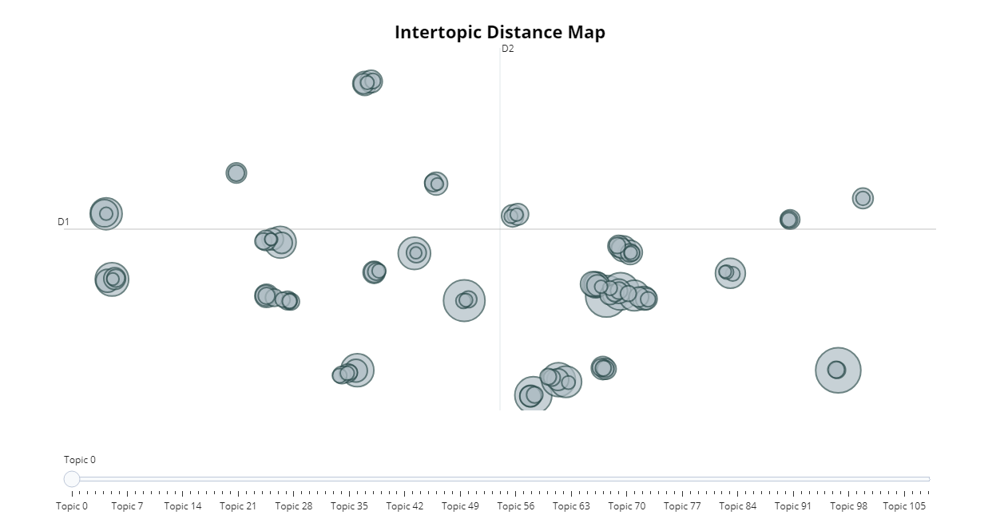

In [99]:
topic_model.visualize_topics()

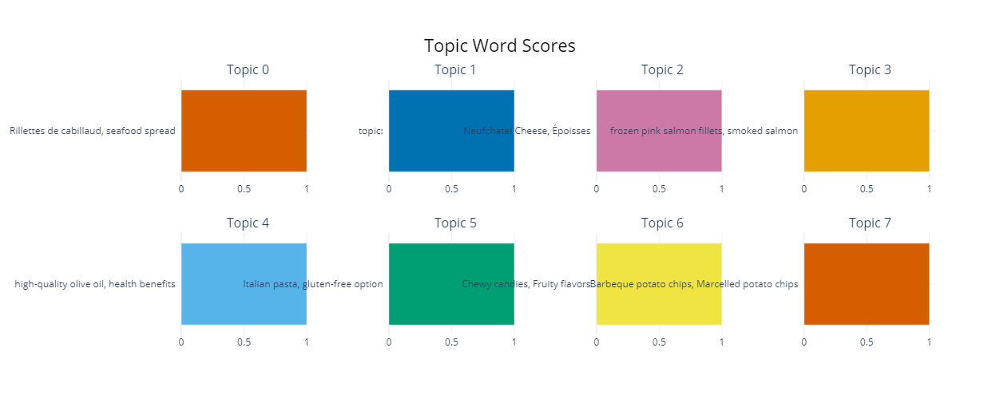

In [100]:
topic_model.visualize_barchart()

In [72]:
topic_model.get_document_info(docs)

In [101]:
df_tp = topic_model.get_document_info(docs)
df_tp['Topic'].value_counts(normalize=True)[0:10]

Topic
-1    0.244463
 0    0.030795
 1    0.026155
 2    0.025944
 3    0.021093
 4    0.020671
 5    0.017296
 6    0.016874
 7    0.016452
 8    0.015819
Name: proportion, dtype: float64

In [139]:
no_topics_openai = len(topic_model.get_topic_info())-1
no_topics_openai

109

## Visualy compare POS and OpenAI topics


In [34]:
# Create POS document to merge
postfix = "_pos"
df_pos = df_document_info_pos[['Document', 'Topic', 'Name', 'Representation', 'Probability']].copy()
df_pos.columns = ['document', f'topic{postfix}', f'name{postfix}', f'representation{postfix}', f'probability{postfix}']
df_pos[0:5]

,document,topic_pos,name_pos,representation_pos,probability_pos
0,"El Salchichón es un producto de origen español que se caracteriza por su sabor y textura única. Es un embutido elaborado a partir de carne de cerdo de alta calidad, condimentado con especias y curado durante un período de tiempo determinado.\n\nUna de las características destacadas de este Salchichón es que está etiquetado como ""Sin gluten"", lo que significa que no contiene ninguna forma de gl...",16,16_sausage_meat_spices_charcuterie,"[sausage, meat, spices, charcuterie, meats, quality, dry, savory, high quality, garlic]",0.656090
1,"Rillettes de cabillaud is a delicious seafood delicacy that originates from France and Switzerland. This delectable dish is made from cod, which is cooked slowly in its own fat until it becomes tender and flavorful. Rillettes de cabillaud is known for its rich and creamy texture, making it a perfect spread for bread or crackers.\n\nWhen it comes to brands, Nestlé is a well-known and reputable ...",1,1_rillettes_cabillaud_cod_fish,"[rillettes, cabillaud, cod, fish, spread, seafood, crackers, products, food, flavorful]",0.901860
2,"Hierba a romatica de chamomile is a delightful tea that is perfect for relaxation and soothing moments. This tea is made from high-quality chamomile flowers, known for their calming properties. The brand owner, HIERBA A ROMATICA DE, ensures that only the finest chamomile is used in the production of this tea.\n\nEach tea bag contains a carefully measured amount of chamomile, allowing for a con...",6,6_tea_green_beverage_leaves,"[tea, green, beverage, leaves, hot, refreshing, benefits, health, blend, cup]",1.000000
3,"Rillettes de cabillaud, also known as cod rillettes, is a delicious seafood spread that can be enjoyed on bread or crackers. Made from salted and seasoned cod, this product falls under the categories of ""Produits de la mer"" (Seafood Products), ""Poissons et dérivés"" (Fish and Derivatives), ""Produits à tartiner"" (Spreadable Products), ""Produits à tartiner salés"" (Savory Spreads), ""Rillettes"" (Po...",1,1_rillettes_cabillaud_cod_fish,"[rillettes, cabillaud, cod, fish, spread, seafood, crackers, products, food, flavorful]",0.901860
4,"The Thin & Crispy Pizza is a delicious meal option that falls under the category of Pizzas, specifically in the subcategory of Pizza pies and quiches. This pizza is known for its thin and crispy crust, which adds a delightful crunch to every bite. It is a perfect choice for pizza lovers who prefer a lighter and more delicate texture.\n\nWith its combination of keywords such as ""thin,"" ""quiche,...",32,32_pizzas_crust_crispy_dough,"[pizzas, crust, crispy, dough, toppings, homemade, frozen, meal, classic, cheese]",0.521115


In [69]:
# Create POS document to merge
postfix = "_openai"
df_openai= df_document_info_openai[['Document', 'Topic', 'Name', 'Representation', 'Probability']].copy()
df_openai.columns = ['document', f'topic{postfix}', f'name{postfix}', f'representation{postfix}', f'probability{postfix}']
df_openai[0:5]

,document,topic_openai,name_openai,representation_openai,probability_openai
0,"El Salchichón es un producto de origen español que se caracteriza por su sabor y textura única. Es un embutido elaborado a partir de carne de cerdo de alta calidad, condimentado con especias y curado durante un período de tiempo determinado.\n\nUna de las características destacadas de este Salchichón es que está etiquetado como ""Sin gluten"", lo que significa que no contiene ninguna forma de gl...",19,"19_Saucisson sec aux noix, Charcupac","[Saucisson sec aux noix, Charcupac]",0.538654
1,"Rillettes de cabillaud is a delicious seafood delicacy that originates from France and Switzerland. This delectable dish is made from cod, which is cooked slowly in its own fat until it becomes tender and flavorful. Rillettes de cabillaud is known for its rich and creamy texture, making it a perfect spread for bread or crackers.\n\nWhen it comes to brands, Nestlé is a well-known and reputable ...",0,"0_Rillettes de cabillaud, seafood spread","[Rillettes de cabillaud, seafood spread]",1.000000
2,"Hierba a romatica de chamomile is a delightful tea that is perfect for relaxation and soothing moments. This tea is made from high-quality chamomile flowers, known for their calming properties. The brand owner, HIERBA A ROMATICA DE, ensures that only the finest chamomile is used in the production of this tea.\n\nEach tea bag contains a carefully measured amount of chamomile, allowing for a con...",9,"9_tea blends, convenient tea bags","[tea blends, convenient tea bags]",1.000000
3,"Rillettes de cabillaud, also known as cod rillettes, is a delicious seafood spread that can be enjoyed on bread or crackers. Made from salted and seasoned cod, this product falls under the categories of ""Produits de la mer"" (Seafood Products), ""Poissons et dérivés"" (Fish and Derivatives), ""Produits à tartiner"" (Spreadable Products), ""Produits à tartiner salés"" (Savory Spreads), ""Rillettes"" (Po...",0,"0_Rillettes de cabillaud, seafood spread","[Rillettes de cabillaud, seafood spread]",1.000000
4,"The Thin & Crispy Pizza is a delicious meal option that falls under the category of Pizzas, specifically in the subcategory of Pizza pies and quiches. This pizza is known for its thin and crispy crust, which adds a delightful crunch to every bite. It is a perfect choice for pizza lovers who prefer a lighter and more delicate texture.\n\nWith its combination of keywords such as ""thin,"" ""quiche,...",31,"31_Pizza dough, Savory flavors","[Pizza dough, Savory flavors]",1.000000


In [70]:
# Merge both, the ones with POS and the one with OpenAI
df_topics_combined = pd.merge(df_pos, df_openai, on="document", how="outer")
df_topics_combined.shape

(4741, 9)

In [71]:
# Check last records
df_topics_combined.tail()

,document,topic_pos,name_pos,representation_pos,probability_pos,topic_openai,name_openai,representation_openai,probability_openai
4736,"Meijer Tasted Oats Honey Nut is a delicious and nutritious breakfast option. Made with high-quality oats, this cereal offers a delightful combination of flavors. The oats are carefully selected and blended with a touch of honey and nutty goodness, creating a satisfying and wholesome taste experience. Whether enjoyed with milk or as a crunchy topping for yogurt, Meijer Tasted Oats Honey Nut pro...",-1,-1_chocolate_treat_product_snack,"[chocolate, treat, product, snack, taste, flavor, sweet, delightful, delicious, flavors]",0.0,22,"22_Corn Cereal, Organic Granola","[Corn Cereal, Organic Granola]",0.529977
4737,"Snyder's Hot Buffalo Wing Pretzels are a delicious snack that combines the bold flavors of buffalo wings with the satisfying crunch of pretzels. Made by Snyder's of Hanover, a renowned brand known for their high-quality snacks, these pretzels are the perfect choice for those who enjoy a spicy kick.\n\nEach pretzel is generously coated with a zesty buffalo wing seasoning, creating a tantalizing...",-1,-1_chocolate_treat_product_snack,"[chocolate, treat, product, snack, taste, flavor, sweet, delightful, delicious, flavors]",0.0,30,"30_Kettle Roasted Peanuts, Peanut Butter Cups","[Kettle Roasted Peanuts, Peanut Butter Cups]",0.283099
4738,"Whole Grain Oat Cereal, Toasted Oats, also known as Toasted oats whole grain oat cereal, is a delicious and nutritious breakfast option. Made from whole grain oats, this cereal is packed with fiber, vitamins, and minerals that are essential for a healthy diet. The oats are carefully toasted to enhance their flavor and give them a satisfying crunch. Whether enjoyed with milk or yogurt, this cer...",53,53_cereal_oatmeal_breakfast_oats,"[cereal, oatmeal, breakfast, oats, start, nutritious, wholesome, cinnamon, organic, day]",1.0,22,"22_Corn Cereal, Organic Granola","[Corn Cereal, Organic Granola]",1.000000
4739,"The Colomba con vermouth rosso Camillo is a delicious snack that combines the flavors of vermouth rosso and Camillo in a traditional Italian brioche. Made with a flaky pastry dough, this sweet treat is perfect for indulging in during snack time or as a dessert. The vermouth rosso adds a unique twist to the classic Colomba, giving it a rich and aromatic taste. Whether you enjoy it with a cup of...",-1,-1_chocolate_treat_product_snack,"[chocolate, treat, product, snack, taste, flavor, sweet, delightful, delicious, flavors]",0.0,-1,"-1_no sugar added fruit cocktail, Tropicana Orange et Mangue","[no sugar added fruit cocktail, Tropicana Orange et Mangue]",0.000000
4740,"Delice du Dahu is a delectable food product that is sure to satisfy your taste buds. This unique delicacy is known for its rich and flavorful taste. The name ""Dahu"" refers to a mythical creature in French folklore, adding a touch of whimsy to this culinary delight.\n\nDelice du Dahu is made using a combination of high-quality ingredients, carefully selected to create a harmonious blend of flav...",58,58_cake_food_rillettes_cabillaud,"[cake, food, rillettes, cabillaud, fish, product, unique, snack, spread, try]",1.0,63,"63_Bánh Piá Durian cake, Dots Jordbærkrisp","[Bánh Piá Durian cake, Dots Jordbærkrisp]",1.000000


## Compare side by side generated topics

In [76]:
df_topics_combined[['document', 'name_pos', 'name_openai', 'probability_pos', 'probability_openai']].sample(5)

,document,name_pos,name_openai,probability_pos,probability_openai
1172,"The Croissant is a popular snack that is loved by many. It is a flaky pastry that originated in France and has since become a staple in bakeries around the world. There are several brands that offer delicious Croissants, including Forno della torretta and Selex. \n\nCroissants fall under various categories, such as Snack, Snack dolci (sweet snack), Pasta sfoglia (puff pastry), and Croissants. ...",-1_chocolate_treat_product_snack,"77_Croissant blé, Le kouign amann",0.000000,1.000000
3907,"Auchan Asperges Vertes Moyennes Boc is a canned food product that contains green asparagus as the main ingredient. The asparagus is preserved in water and salt to maintain its freshness and flavor. These medium-sized green asparagus are carefully selected and canned to ensure their quality.\n\nThis product falls under the category of plant-based foods and beverages, specifically in the preserv...",77_fruits_son_aliments_des,"70_Abricots, Syrup",0.966194,1.000000
1006,"Eier Lidl is a product that offers fresh eggs from controlled farming in Germany. These eggs are of grade A quality and are produced without the use of genetically modified organisms (GMOs). Lidl ensures that their eggs come from hens raised in a controlled environment with access to the ground, promoting animal welfare and the natural behavior of the birds. The packaging of these eggs is made...",67_eggs_egg_breakfast_farming,"83_eggs, farming",1.000000,1.000000
2170,"Salsicce secche, also known as dry sausages, are a popular Italian delicacy. These sausages are made from high-quality cuts of pork that are seasoned with a blend of aromatic herbs and spices. The meat is then stuffed into natural casings and left to air dry for an extended period of time. This slow drying process allows the flavors to develop and intensify, resulting in a rich and savory tast...",16_sausage_meat_spices_charcuterie,"19_Saucisson sec aux noix, Charcupac",0.656090,0.520985
1992,"Crema de Calabaza is a gourmet food product that is perfect for preparing a delicious soup. Made from dehydrated pumpkin, this product from the Bon Gourmet brand offers a convenient and easy way to enjoy a flavorful and comforting meal. The packaging, which consists of a plastic bag, ensures the preservation of the product's quality and freshness.\n\nOriginating from Chile, this dehydrated pum...",82_cream_creamy_spread_cheese,"60_Schlagsahne, whipped cream",1.000000,0.897503


In [77]:
# Compare probability scores
df_topics_combined[['probability_pos', 'probability_openai']].mean()

probability_pos       0.576758
probability_openai    0.606919
dtype: float64

In [80]:
# Check to see if topics generated by openai would work for those documents where not topics where generated
df_topics_combined[['document', 'name_pos', 'name_openai', 'probability_pos', 'probability_openai']].query("probability_pos==0").sample(5)

,document,name_pos,name_openai,probability_pos,probability_openai
1460,"Croissants Jambon Fromage, also known as Ham and Cheese Croissants, are a delicious and savory pastry that combines the buttery flakiness of a croissant with the rich flavors of ham and cheese. Made by L'Atelier Traiteur, a renowned brand in the culinary industry, these croissants are crafted with utmost care and expertise.\n\nThe croissant itself is made using traditional French techniques, r...",-1_chocolate_treat_product_snack,"77_Croissant blé, Le kouign amann",0.0,1.000000
2879,"Kokchoy is a versatile leafy vegetable that is commonly used in Asian cuisine. It is known for its crisp texture and mild, slightly bitter flavor. Kokchoy can be enjoyed raw in salads or cooked in stir-fries, soups, and other dishes.\n\nAli is a name that does not provide any specific information about the food product. Therefore, no further details can be provided.\n\nWhen it comes to labels,...",-1_chocolate_treat_product_snack,"28_versatile coconut products, health benefits",0.0,0.731223
2743,"Biglietto in pasta di zucchero is a delightful food product that combines the art of sugar crafting with the joy of sending a message. Made with utmost care and attention to detail, this edible masterpiece features a beautifully crafted sugar ticket. \n\nThe Biglietto in pasta di zucchero is perfect for special occasions such as birthdays, anniversaries, or any event where you want to add a to...",-1_chocolate_treat_product_snack,"6_Chewy candies, Fruity flavors",0.0,0.482604
544,"Las Migas de bacalao desalado de la marca Ubago son un delicioso producto elaborado con bacalao de alta calidad. Estas migas de bacalao desalado son perfectas para preparar una gran variedad de platos, desde guisos y sopas hasta ensaladas y aperitivos.\n\nEl bacalao utilizado en la elaboración de estas migas es cuidadosamente desalado para garantizar su sabor y textura óptimos. Las migas de ba...",-1_chocolate_treat_product_snack,"29_Sweet Potato Gnocchi, Deliciosas Gomilocas",0.0,1.000000
93,"The product in question is a beef steak called ""Bifteck"" by the brand Charal. It is made in France using French beef. The packaging is made of plastic and is labeled as ""Frais"" (fresh) and ""Hebdopack"". The beef used in this steak is suitable for grilling. \n\nThe product is part of the ""Viandes et dérivés"" (Meat and derivatives), ""Viande de bœuf et dérivés"" (Beef and beef derivatives), ""Viande...",-1_chocolate_treat_product_snack,"88_French beef products, Meat and derivatives",0.0,0.892897


In [81]:
# How many documents have no topic for either ?
# Check to see if topics generated by openai would work for those documents where not topics where generated
df_topics_combined[['document', 'name_pos', 'name_openai', 'probability_pos', 'probability_openai']].query("probability_pos==0 and probability_openai==0").shape

(617, 5)

In [82]:
def select_final_topic(row):
    """Given a row of data, clean topics and if no topic was assigned, use openai's if one was assigned"""
    topics = ""
    probability = 0
    topic_offset = 0
    if row['probability_pos']==0 and row['probability_openai']>0:
        topics = row['name_openai']
        probability =  row['probability_openai']
        topic_offset = 1000 # Account for collisions, assumtion pos topics < 1000
    else:
        topics = row['name_pos']
        probability =  row['probability_pos']        
    # Clean name    
    topic_number = int(re.search("-?\d+", topics)[0]) + topic_offset if probability > 0 else -1
    topics = re.sub(r"-?\d+_", "", topics) 
    topics = topics.replace("_", ", ")
    
    return topics, probability, topic_number

In [83]:
# Create final topic documentation
df_final_topics = df_topics_combined[['document', 'name_pos', 'name_openai', 'probability_pos', 'probability_openai']]
df_final_topics[['topics', 'probability','topic_number']] =list(df_topics_combined.apply(lambda row:select_final_topic(row), axis=1))

In [84]:
df_final_topics[['topics', 'probability','topic_number']]

,topics,probability,topic_number
0,"sausage, meat, spices, charcuterie",0.65609,16
1,"rillettes, cabillaud, cod, fish",0.90186,1
2,"tea, green, beverage, leaves",1.0,6
3,"rillettes, cabillaud, cod, fish",0.90186,1
4,"pizzas, crust, crispy, dough",0.521115,32
...,...,...,...
4736,"Corn Cereal, Organic Granola",0.529977,1022
4737,"Kettle Roasted Peanuts, Peanut Butter Cups",0.283099,1030
4738,"cereal, oatmeal, breakfast, oats",1.0,53
4739,"chocolate, treat, product, snack",0.0,-1


In [95]:
# Combine with raw data
df_docs_with_topic = pd.merge(df_information_found, df_final_topics[['document','topics', 'probability','topic_number']], left_on="generated_text", right_on="document", how="outer")

In [100]:
df_docs_with_topic.to_pickle("data/df_docs_with_topic.pkl")

In [234]:
#pip install openpyxl

In [101]:
df_docs_with_topic.to_excel("data/df_docs_with_topic.xlsx", index=False)

In [63]:
df_docs_with_topic.head(10)

,id,text,generated_text,topics,probability,topic_number
0,1.0,"product_name_es:Salchichón, labels:Sin gluten, Punto Verde","El Salchichón es un producto de origen español que se caracteriza por su sabor y textura única. Es un embutido elaborado a partir de carne de cerdo de alta calidad, condimentado con especias y curado durante un período de tiempo determinado.\n\nUna de las características destacadas de este Salchichón es que está etiquetado como ""Sin gluten"", lo que significa que no contiene ninguna forma de gl...","sausage, meat, spices, charcuterie",0.65609,16
1,2.0,"countries:France, Suisse, brands:Nestlé, brands_tags:nestle","Rillettes de cabillaud is a delicious seafood delicacy that originates from France and Switzerland. This delectable dish is made from cod, which is cooked slowly in its own fat until it becomes tender and flavorful. Rillettes de cabillaud is known for its rich and creamy texture, making it a perfect spread for bread or crackers.\n\nWhen it comes to brands, Nestlé is a well-known and reputable ...","rillettes, cabillaud, cod, fish",0.90186,1
2,3.0,"product_name:Hierba a romatica de, chamomile, brand_owner_imported:HIERBA A ROMATICA DE, sources_fields.org-database-usda.fdc_category:Tea Bags","Hierba a romatica de chamomile is a delightful tea that is perfect for relaxation and soothing moments. This tea is made from high-quality chamomile flowers, known for their calming properties. The brand owner, HIERBA A ROMATICA DE, ensures that only the finest chamomile is used in the production of this tea.\n\nEach tea bag contains a carefully measured amount of chamomile, allowing for a con...","tea, green, beverage, leaves",1.0,6
3,4.0,"product_name:Rillettes de cabillaud, _keywords:mer,tartiner,poisson,sale,rillette,produit,preparation,de,cabillaud,la, categories:Produits de la mer, Poissons et dérivés, Poissons, Produits à tartiner, Produits à tartiner salés, Rillettes, Préparations de poisson, Rillettes de poissons, Rillettes de cabillaud, categories_old:Produits de la mer, Poissons, Produits à tartiner, Produits à tartine...","Rillettes de cabillaud, also known as cod rillettes, is a delicious seafood spread that can be enjoyed on bread or crackers. Made from salted and seasoned cod, this product falls under the categories of ""Produits de la mer"" (Seafood Products), ""Poissons et dérivés"" (Fish and Derivatives), ""Produits à tartiner"" (Spreadable Products), ""Produits à tartiner salés"" (Savory Spreads), ""Rillettes"" (Po...","rillettes, cabillaud, cod, fish",0.90186,1
4,5.0,"product_name:Thin & crispy pizza, pnns_groups_2:Pizza pies and quiches, _keywords:thin,quiche,pie,and,pizza,crispy,meal, categories:Meals, Pizzas pies and quiches, Pizzas, sources_fields.org-database-usda.fdc_category:Pizza","The Thin & Crispy Pizza is a delicious meal option that falls under the category of Pizzas, specifically in the subcategory of Pizza pies and quiches. This pizza is known for its thin and crispy crust, which adds a delightful crunch to every bite. It is a perfect choice for pizza lovers who prefer a lighter and more delicate texture.\n\nWith its combination of keywords such as ""thin,"" ""quiche,...","pizzas, crust, crispy, dough",0.521115,32
5,6.0,"last_modified_by:beniben, ciqual_food_name_tags:brioche, product_name:Brioche Trancado Fatiado, _keywords:trancado,brioche,fatiado,tranchee,pasquier, brands:Brioche Pasquier, ecoscore_data.agribalyse.name_fr:Brioche, sans précision, ecoscore_data.agribalyse.name_en:Brioche, packaging:Plastica, Sacco, debug_param_sorted_langs:fr,it, purchase_places:Italie, purchase_places_tags:italie","The product in question is called ""Brioche Trancado Fatiado"" and it is a type of brioche bread. It is produced by the brand Brioche Pasquier. The bread is sliced and packaged in plastic bags. It is commonly found in Italy, as indicated by the purchase places information. The last modification of the product information was done by ""beniben"". Unfortunately, no additional info